In [1]:
from joblib import dump, load 
import shap 
import pandas as pd 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from fonctions import *

# Récupération des tables et des modèles construits précédemment

feature_matrix = pd.read_pickle('20230225_table_feature_matrix.csv')
target = pd.read_pickle('20230225_table_target.csv')

X_train, X_test, y_train, y_test = train_test_split(feature_matrix, target, test_size=0.2, random_state=1)


elasticNet = load("optimal_model_en.joblib")
xgb_model = load("optimal_xgb.joblib")
lgbm_model = load("optimal_model_LGBM.joblib")

rf_model = load("rf.joblib")

scaler = StandardScaler()
train_scaled = scaler.fit_transform(X_train)
test_scaled = scaler.transform(X_test)
train_scaled_df = pd.DataFrame(train_scaled, columns = X_train.columns)
test_scaled_df = pd.DataFrame(test_scaled, columns = X_test.columns)



Trying to unpickle estimator DecisionTreeClassifier from version 1.0.2 when using version 1.2.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestClassifier from version 1.0.2 when using version 1.2.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


In [6]:
# Récupération des prédictions dses modèles pour la suite

xgb_preds_test = xgb_model.predict_proba(X_test)[:,1]

en_preds_test = elasticNet.predict(test_scaled_df)

lgbm_preds_test = lgbm_model.predict_proba(X_test)[:,1]

rf_preds_test = rf_model.predict_proba(X_test)[:,1]

X has feature names, but ElasticNet was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names


0.7969546801648293
0.7749266053484977
0.7906139641529413
0.7434061146146057


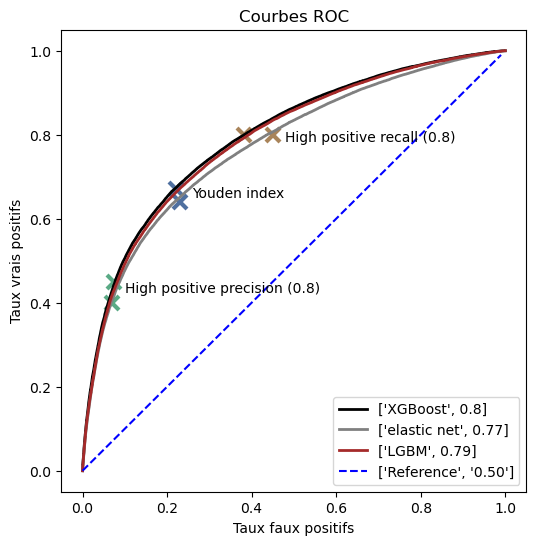

In [9]:
### ROC curves des modèles optimisés
plt.figure(figsize=(6, 6))
fpr_xgb, tpr_xgb, _ = roc_curve(y_test, xgb_preds_test,pos_label=1)
roc_auc_xgb = auc(fpr_xgb, tpr_xgb)
print(roc_auc_xgb)
fpr_en, tpr_en, _ = roc_curve(y_test, en_preds_test,pos_label=1)
roc_auc_en = auc(fpr_en,tpr_en )
print(roc_auc_en)
fpr_lgbm, tpr_lgbm, _ = roc_curve(y_test, lgbm_preds_test,pos_label=1)
roc_auc_lgbm = auc(fpr_lgbm,tpr_lgbm )
print(roc_auc_lgbm)
fpr_rf, tpr_rf, _ = roc_curve(y_test, rf_preds_test,pos_label=1)
roc_auc_rf = auc(fpr_rf,tpr_rf )
print(roc_auc_rf)
# High positive recall
plt.plot(1-0.617, 0.8, 'x', color='#A9845A', markersize=10, mew=3)
plt.plot(1-0.55, 0.8, 'x', color='#A9845A', markersize=10, mew=3)
# High positive precision
plt.plot(1-0.925, 0.45, 'x', color='#5AAA85', markersize=10, mew=3)
plt.plot(1-0.93, 0.4, 'x', color='#5AAA85', markersize=10, mew=3)
# Youden
plt.plot(1-0.78, 0.67, 'x', color='#4F70A0', markersize=10, mew=3)
plt.plot(1-0.77, 0.64, 'x', color='#4F70A0', markersize=10, mew=3)
# ROC
plt.plot(fpr_xgb, tpr_xgb, color='black', lw=2, label=['XGBoost', round(roc_auc_xgb, 2)])
plt.plot(fpr_en, tpr_en, color='grey', lw=2, label=['elastic net', round(roc_auc_en, 2)])
plt.plot(fpr_lgbm, tpr_lgbm, color='brown', lw=2, label=['LGBM', round(roc_auc_lgbm, 2)])
plt.plot(np.arange(0, 1, 0.01), np.arange(0, 1, 0.01), 'b--', label=['Reference', '0.50'])
plt.ylabel('Taux vrais positifs')
plt.xlabel('Taux faux positifs')
plt.title('Courbes ROC')
plt.legend(loc='lower right')
plt.annotate('High positive precision (0.8)', xy=(1-0.9, 0.425), xytext=(1-0.9, 0.425))
plt.annotate('High positive recall (0.8)', xy=(1-0.52, 0.785), xytext=(1-0.52, 0.785))
plt.annotate('Youden index', xy=(1-0.74, 0.65), xytext=(1-0.74, 0.65));

# Carefull, precision is not monotone

# User case: comment calibrer notre modèle ?

##### Case-study: Discussion au gouvernement

*Le président vient d'entrer en fonction et il voudrait savoir combien d'argent il doit allouer au ministère des transports.*  

- <span style="background-color: #E8CCAB">*Le ministre des transports veut réduire au maximum le nombre d'accidents graves, quel que soit le prix.*</span>

- <span style="background-color: #ABE8CC">*Le ministre de l'économie veut optimiser les dépenses pour réduire le nombre d'accidents graves.*</span>

- <span style="background-color: #97BFF9">*L'expert analyste propose un entre-deux afin que les dépenses soient faites pour réduire un nombre important d'accidents graves, sans que cela concerne trop d'accidents bénins.*</span>

*D'un point de vue statistique, voici à quoi correspondrait chaque proposition.*

Ici, nous pouvons voir la distribution des probabilités pour chaque accident d'être grave ou non selon les prédictions du XGBoost.  


<Figure size 600x400 with 0 Axes>

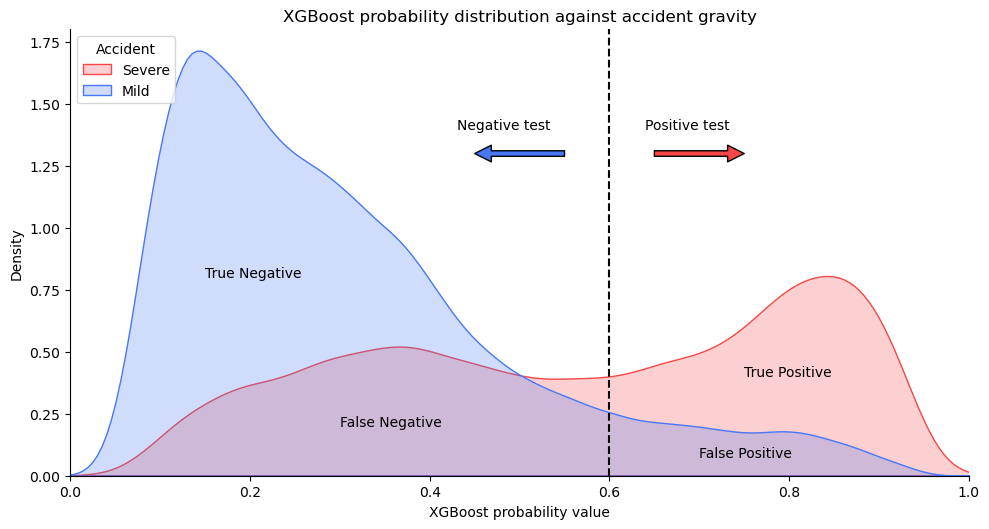

<Figure size 600x400 with 0 Axes>

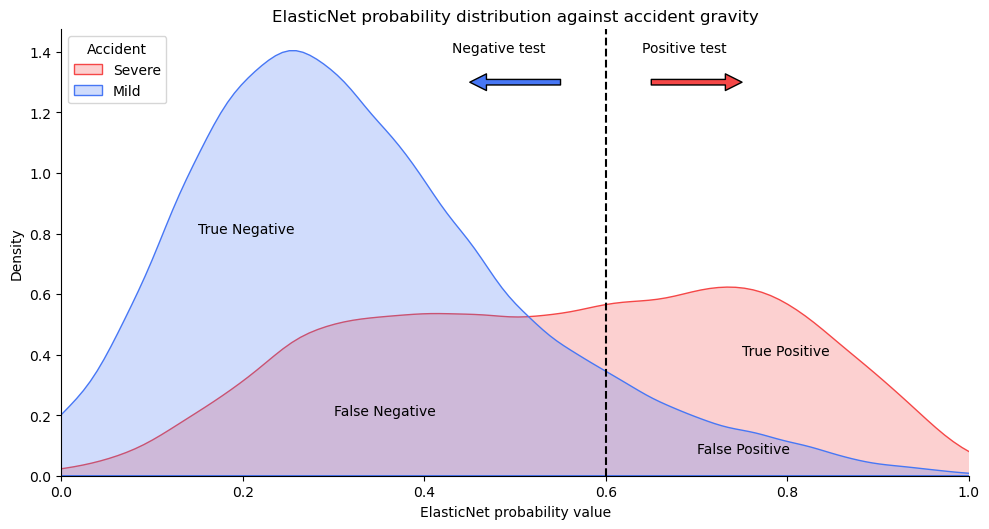

<Figure size 600x400 with 0 Axes>

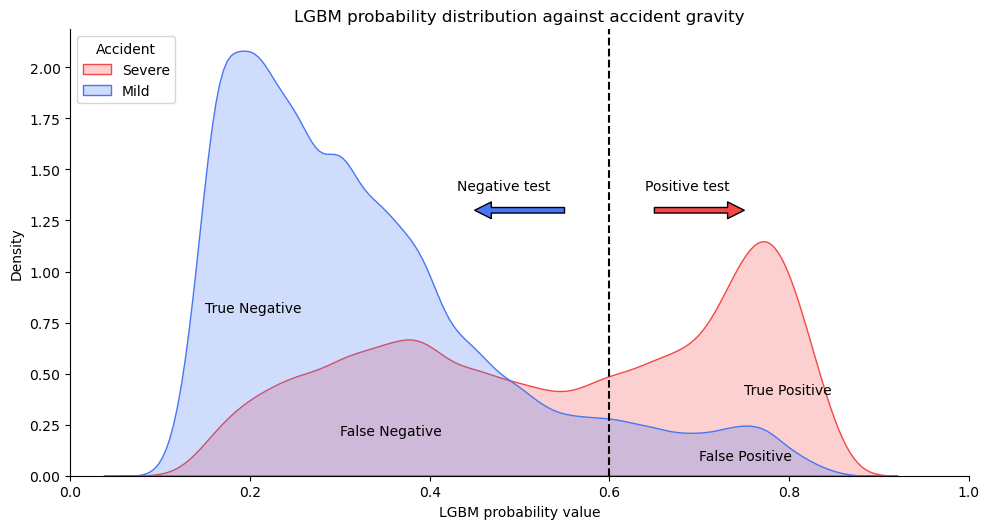

In [4]:
### Plot models probability values against accident observed values
plot_density_model("XGBoost", xgb_preds_test, y_test)

plot_density_model("LGBM", lgbm_preds_test, y_test)


A partir de ces distributions, nous pouvons choisir un seuil/cutoff et construire un tableau de contingence comme nous pouvons voir ci-dessous.  

|  | Negative Prediction | Positive Prediction |
| --- | --- | --- |
| **Mild accident** | True Negative | False Positive |
| **Severe accident** | False Negative | True Positive |

- <span style="background-color: #E8CCAB">*La proposition du ministre des transports requièrerait d'avoir un maximum de Vrai Positifs et donc d'utiliser un cutoff bas, qui permettrait de prédire plus de prédictions positives, i.e. plus d'accidents comme étant prédits graves. Cela augmenterait le nombre de Vrais Positifs mais également le nombre de Faux Positifs. L'impact serait d'augmenter le recall positif au prix d'une réduction de la précision positive.*  </span>

$$ PositiveRecall = {True Positive \over (True Positive + False Negative)} $$

- <span style="background-color: #ABE8CC">*La proposition du ministre de l'économie requièrerait d'avoir un maximum de Vrais Positifs parmi les accidents prédits positifs et donc d'utiliser un cutoff haut, qui permettrait d'augmenter la probabilité que les accidents prédits graves le soient vraiment. Cela baisserait le nombre de Faux Positifs mais également le nombre de Vrais Positifs. L'impact serait d'augmenter la précision positive, au coût d'une baisse du recall positif.*</span>

$$ PositivePrecision = {True Positive \over (True Positive + False Positive)} $$

- <span style="background-color: #97BFF9">*La proposition de l'expert analyste est un entre deux, pour lequel on essayerait d'avoir un nombre de Vrais Positifs et de Vrais Négatifs élevé, ce qui requièrerait d'utiliser le cutoff de Youden (cutoff maximisant la formule 'recall positif + recall négatif'). Il sera un bon compromis pour avoir un recall positif élevé tout en ayant un recall négatif élevé.*  </span>

$$ NegativeRecall = {True Negative \over (True Negative + False Positive)} $$

Le Youden Index est défini comme le cut off défini dans la formule suivante (cut off pour lequel on maximise la somme 'recall positif + recall négatif'):   

$max(PositiveRecall_{cutOff} + NegativeRecall_{cutOff})$ for $cutOff = 0,...,1$

2 questions à partir de cette problématique :  
- Quels cutoffs et quelles performances nous atteindrons pour chaque problématique ?  
- Quel modèle choisir pour optimiser les performances ?  

Une fois le cutoff choisi, l'objectif serait de déterminer les facteurs qui prédisent les accidents sévères afin de faire des optimisations sur les infrastructures (lumières supplémentaires, limitations de vitesse, sens de circulation, ...).  

### Get results for each model and each cutoff

##### 1- XGBoost

In [5]:
pd.options.display.max_rows = None

summary_result_xgb = get_youden_index_and_cutoffs(xgb_preds_test, y_test)
print(summary_result_xgb)

Youden index= 0.43
       seuils  precision_0  precision_1  recall_0  recall_1  f1_0  f1_1
0        1.98         0.58          NaN      1.00      0.00  0.74   NaN
1        0.98         0.58         1.00      1.00      0.00  0.74  0.00
2        0.96         0.58         1.00      1.00      0.00  0.74  0.00
3        0.96         0.58         0.99      1.00      0.00  0.74  0.00
4        0.96         0.58         0.99      1.00      0.00  0.74  0.00
5        0.96         0.58         0.98      1.00      0.00  0.74  0.00
6        0.95         0.58         0.99      1.00      0.00  0.74  0.00
7        0.95         0.58         0.98      1.00      0.00  0.74  0.00
8        0.95         0.58         0.98      1.00      0.00  0.74  0.00
9        0.95         0.58         0.98      1.00      0.00  0.74  0.00
10       0.95         0.58         0.98      1.00      0.00  0.74  0.01
11       0.95         0.58         0.97      1.00      0.00  0.74  0.01
12       0.95         0.58         0.98      

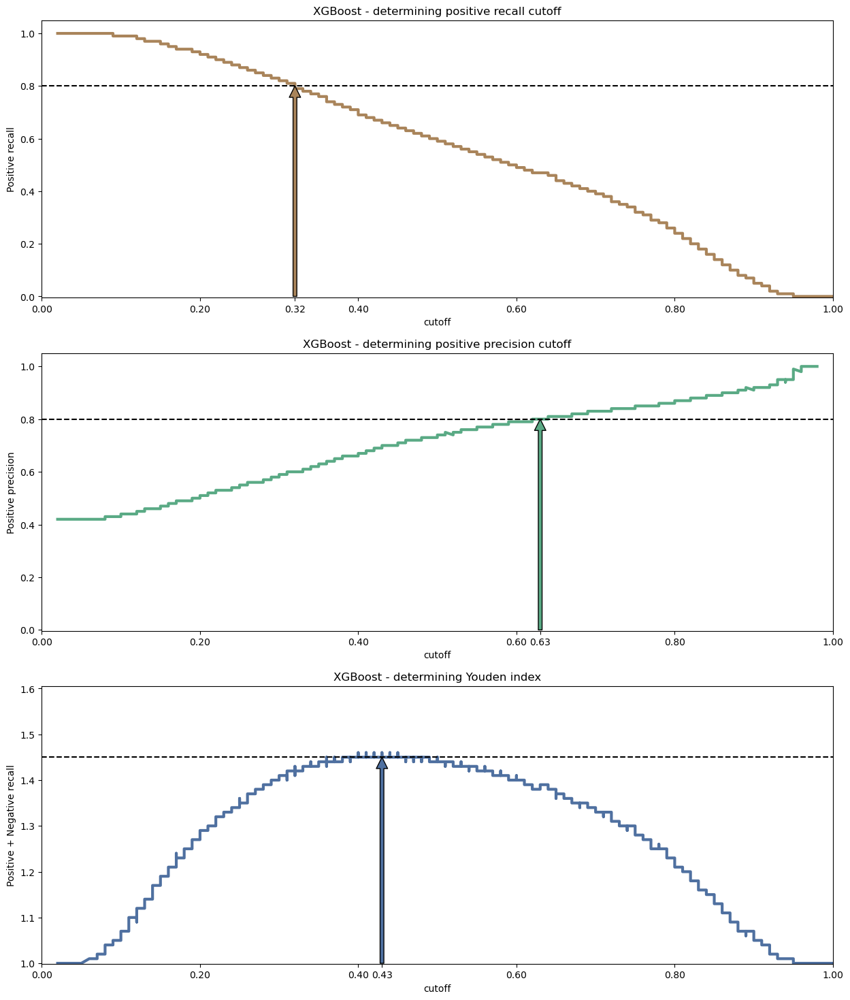

In [6]:
plot_critere_scenarios(summary_result_xgb, 0.43, 0.63, 0.32)

##### 2- Elastic Net

In [13]:
summary_result_en = get_youden_index_and_cutoffs(en_preds_test, y_test)
print(summary_result_en)

Youden index= 0.71
       seuils  precision_0  precision_1  recall_0  recall_1  f1_0  f1_1
0       12.32         0.58          NaN       1.0       0.0  0.74   NaN
1       11.32         0.58         0.00       1.0       0.0  0.74   NaN
2        9.83         0.58         0.91       1.0       0.0  0.74  0.00
3        9.78         0.58         0.83       1.0       0.0  0.74  0.00
4        9.50         0.58         0.90       1.0       0.0  0.74  0.00
...       ...          ...          ...       ...       ...   ...   ...
65576   -4.84         0.50         0.42       0.0       1.0  0.00  0.59
65577   -5.27         0.67         0.42       0.0       1.0  0.00  0.59
65578   -5.64         0.50         0.42       0.0       1.0  0.00  0.59
65579   -5.79         1.00         0.42       0.0       1.0  0.00  0.59
65580   -5.96          NaN         0.42       0.0       1.0   NaN  0.59

[65581 rows x 7 columns]


##### 3- LGBM

In [5]:
summary_result_lgbm = get_youden_index_and_cutoffs(lgbm_preds_test, y_test)
print(summary_result_lgbm)

Youden index= 0.42
       seuils  precision_0  precision_1  recall_0  recall_1  f1_0  f1_1
0        1.88         0.58          NaN      1.00      0.00  0.74   NaN
1        0.88         0.58         1.00      1.00      0.00  0.74  0.00
2        0.87         0.58         1.00      1.00      0.00  0.74  0.00
3        0.87         0.58         1.00      1.00      0.00  0.74  0.00
4        0.85         0.58         1.00      1.00      0.00  0.74  0.00
5        0.85         0.58         1.00      1.00      0.00  0.74  0.00
6        0.85         0.58         1.00      1.00      0.00  0.74  0.00
7        0.85         0.58         1.00      1.00      0.00  0.74  0.00
8        0.84         0.58         1.00      1.00      0.00  0.74  0.00
9        0.84         0.58         0.95      1.00      0.00  0.74  0.00
10       0.84         0.58         0.95      1.00      0.00  0.74  0.00
11       0.84         0.58         0.94      1.00      0.00  0.74  0.00
12       0.84         0.58         0.94      

### Travail des différents scénarios et récupération des variables intéressantes pour chacun des acteurs

##### 1 - Scénario Ministre des Transports (objectif d'un Recall élevé) 

              precision    recall  f1-score   support

           0       0.81      0.60      0.69     99368
           1       0.59      0.80      0.68     71240

    accuracy                           0.69    170608
   macro avg       0.70      0.70      0.69    170608
weighted avg       0.72      0.69      0.69    170608

              precision    recall  f1-score   support

           0       0.82      0.60      0.69     99368
           1       0.59      0.81      0.68     71240

    accuracy                           0.69    170608
   macro avg       0.70      0.71      0.69    170608
weighted avg       0.72      0.69      0.69    170608

              precision    recall  f1-score   support

           0       0.80      0.55      0.65     99368
           1       0.56      0.81      0.66     71240

    accuracy                           0.66    170608
   macro avg       0.68      0.68      0.66    170608
weighted avg       0.70      0.66      0.66    170608



invalid value encountered in longlong_scalars
Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
invalid value encountered in longlong_scalars
Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Elastic Net    29
XGBoost        20
LGBM            4
Name: modele_plus_performant, dtype: int64
                                feature  mesure_max
0                 populationGrp_Village    0.997574
1                              situ_8.0    0.985965
5                               lum_3.0    0.974675
6                              catr_3.0    0.974623
4                              situ_3.0    0.974412
7                               atm_7.0    0.966255
2               intGrp_Passage à niveau    0.963303
3                               atm_5.0    0.961696
10           populationGrp_Petite Ville    0.952679
9                           planGrp_1.0    0.935546
8                              situ_4.0    0.935354
11                             prof_3.0    0.917416
12                      catv_PL_exist_1    0.902818
21                              col_5.0    0.893730
13                             catr_2.0    0.886360
15                              col_7.0    0.883635
14                 

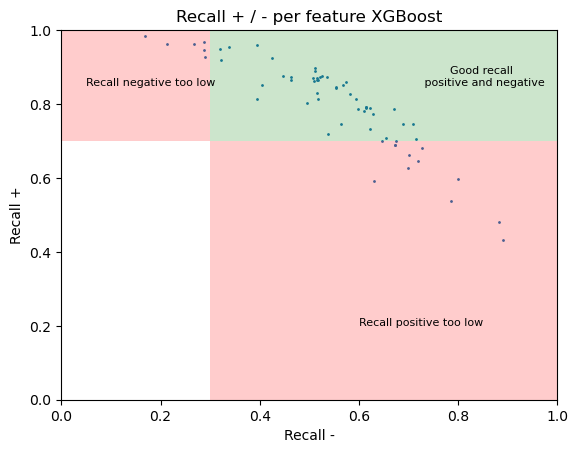

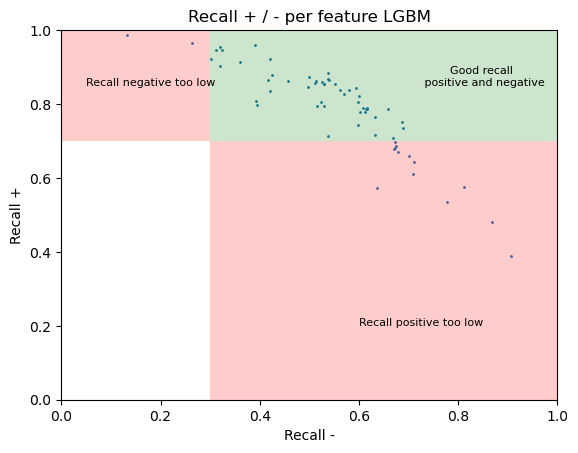

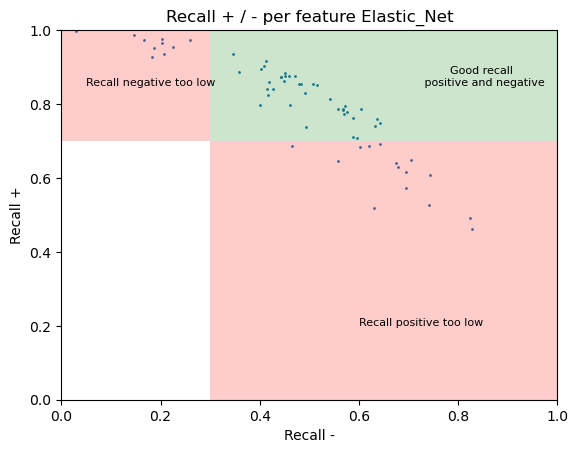

In [7]:
pd.options.display.max_rows = None

cutoff , model_pred_test= get_optimized_cutoff(lgbm_preds_test,X_test, y_test, 0.8, "transports","LGBM")
cutoff2 , model_pred_test_xgb= get_optimized_cutoff(xgb_preds_test,X_test, y_test, 0.8,"transports", "XGBoost")
cutoff3 , model_pred_test_en= get_optimized_cutoff(en_preds_test,X_test, y_test, 0.8,"transports", "ElasticNet")

feature_selected_xgb = significativite_mesure(X_test, y_test, model_pred_test_xgb, "XGBoost",'transports', 0.3,0.7)
feature_selected_lgbm = significativite_mesure(X_test, y_test, model_pred_test, "LGBM",'transports',0.3,0.7)
feature_selected_en = significativite_mesure(X_test, y_test, model_pred_test_en, "Elastic_Net",'transports',0.3,0.7)

feature_results = feature_selected_xgb.merge(feature_selected_lgbm, on = "feature", how = 'outer')
feature_results = feature_results.merge(feature_selected_en, on = "feature", how = 'outer').fillna(0)

feature_results['modele_plus_performant'] = feature_results.apply(get_max, axis = 1) 
feature_results['mesure_max'] = feature_results.apply(lambda x : max(x.mesure_XGBoost, x.mesure_LGBM, x.mesure_Elastic_Net), axis = 1) 

print(feature_results['modele_plus_performant'].value_counts())
print(feature_results[['feature', 'mesure_max']].sort_values(by = 'mesure_max', ascending = False))


##### 2 - Scénario Ministre de l'Economie (objectif d'une Précision élevée) 

              precision    recall  f1-score   support

           0       0.70      0.92      0.79     99368
           1       0.80      0.45      0.58     71240

    accuracy                           0.72    170608
   macro avg       0.75      0.68      0.69    170608
weighted avg       0.74      0.72      0.70    170608

              precision    recall  f1-score   support

           0       0.70      0.92      0.80     99368
           1       0.80      0.46      0.59     71240

    accuracy                           0.73    170608
   macro avg       0.75      0.69      0.69    170608
weighted avg       0.75      0.73      0.71    170608

              precision    recall  f1-score   support

           0       0.69      0.93      0.79     99368
           1       0.80      0.41      0.54     71240

    accuracy                           0.71    170608
   macro avg       0.75      0.67      0.67    170608
weighted avg       0.74      0.71      0.69    170608



Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Elastic Net    24
LGBM           20
XGBoost        16
Name: modele_plus_performant, dtype: int64
                                feature  mesure_max
0               intGrp_Passage à niveau    0.885714
1                              situ_3.0    0.850506
8                               col_4.0    0.843575
43              populationGrp_Métropole    0.843137
57           populationGrp_Grande Ville    0.840000
2                               lum_3.0    0.838983
21                             surf_8.0    0.835294
3                          hourGrp_nuit    0.834747
7                              prof_3.0    0.830495
4                 populationGrp_Village    0.825691
9                               atm_5.0    0.824962
6                               col_6.0    0.824435
5                           planGrp_1.0    0.823781
23                              atm_7.0    0.822526
17                      catv_PL_exist_1    0.820159
14                              atm_8.0    0.817644
12                 

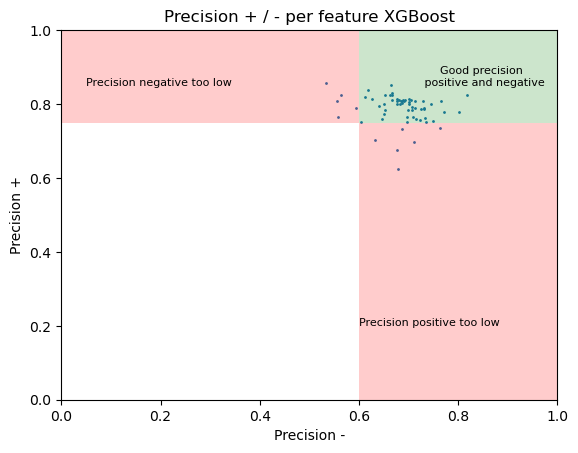

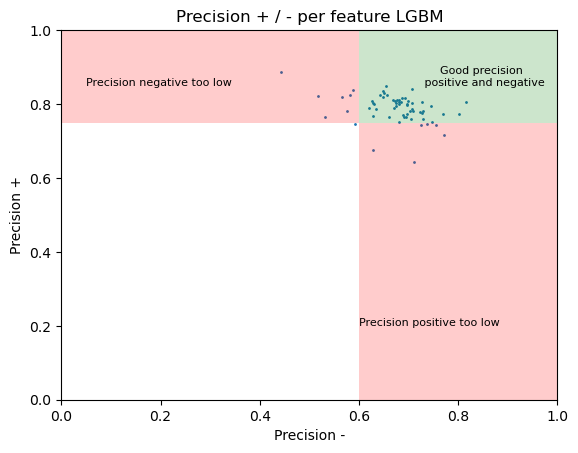

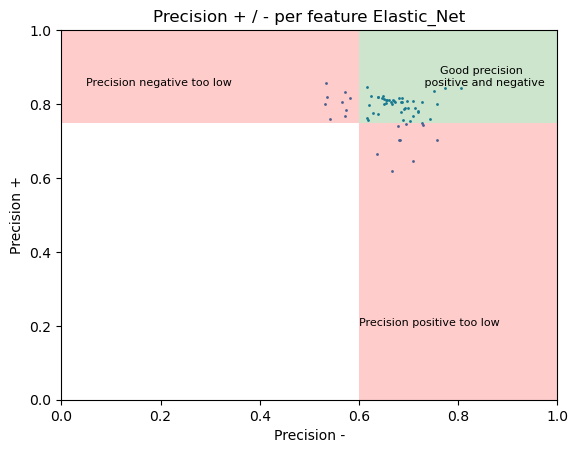

In [8]:
cutoff , model_pred_test= get_optimized_cutoff(lgbm_preds_test,X_test, y_test, 0.8, "économie","LGBM")
cutoff2 , model_pred_test_xgb= get_optimized_cutoff(xgb_preds_test,X_test, y_test, 0.8,"économie","XGBoost")
cutoff3 , model_pred_test_en= get_optimized_cutoff(en_preds_test,X_test, y_test, 0.8,"économie","ElasticNet")

feature_selected_xgb = significativite_mesure(X_test, y_test, model_pred_test_xgb, "XGBoost", "économie",0.6,0.75)
feature_selected_lgbm = significativite_mesure(X_test, y_test, model_pred_test, "LGBM", "économie",0.6,0.75)
feature_selected_en = significativite_mesure(X_test, y_test, model_pred_test_en, "Elastic_Net", "économie",0.6,0.75)
feature_results = feature_selected_xgb.merge(feature_selected_lgbm, on = "feature", how = 'outer')
feature_results = feature_results.merge(feature_selected_en, on = "feature", how = 'outer').fillna(0)

feature_results['modele_plus_performant'] = feature_results.apply(get_max, axis = 1) 
feature_results['mesure_max'] = feature_results.apply(lambda x : max(x.mesure_XGBoost, x.mesure_LGBM, x.mesure_Elastic_Net), axis = 1) 

print(feature_results['modele_plus_performant'].value_counts())
print(feature_results[['feature', 'mesure_max']].sort_values(by = 'mesure_max', ascending = False))



##### 3 - Scénario Expert Data (objectif de maximiser la somme du Recall et de la Precision 

              precision    recall  f1-score   support

           0       0.76      0.78      0.77     99368
           1       0.68      0.66      0.67     71240

    accuracy                           0.73    170608
   macro avg       0.72      0.72      0.72    170608
weighted avg       0.73      0.73      0.73    170608

              precision    recall  f1-score   support

           0       0.77      0.79      0.78     99368
           1       0.69      0.67      0.68     71240

    accuracy                           0.74    170608
   macro avg       0.73      0.73      0.73    170608
weighted avg       0.74      0.74      0.74    170608

              precision    recall  f1-score   support

           0       0.75      0.79      0.77     99368
           1       0.69      0.63      0.66     71240

    accuracy                           0.72    170608
   macro avg       0.72      0.71      0.71    170608
weighted avg       0.72      0.72      0.72    170608



Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


XGBoost        57
LGBM            5
Elastic Net     1
Name: modele_plus_performant, dtype: int64
                                feature  mesure_max
0                              prof_3.0    1.502216
1                               atm_8.0    1.488245
2                        mois_label_jul    1.481525
3                        mois_label_aug    1.479260
4                              surf_8.0    1.478237
5                              surf_2.0    1.477801
6                              situ_3.0    1.477507
7   trajet_coursesPromenade_conductor_1    1.476163
8                               col_7.0    1.474534
9                              prof_2.0    1.471188
10                      catv_PL_exist_1    1.469408
11             intGrp_Hors intersection    1.467480
12                         hourGrp_nuit    1.465633
13                             circ_2.0    1.463526
14                          planGrp_1.0    1.459550
15                              col_5.0    1.457363
16                s

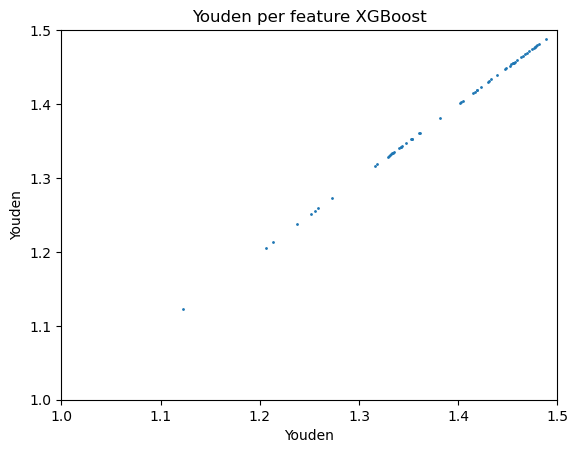

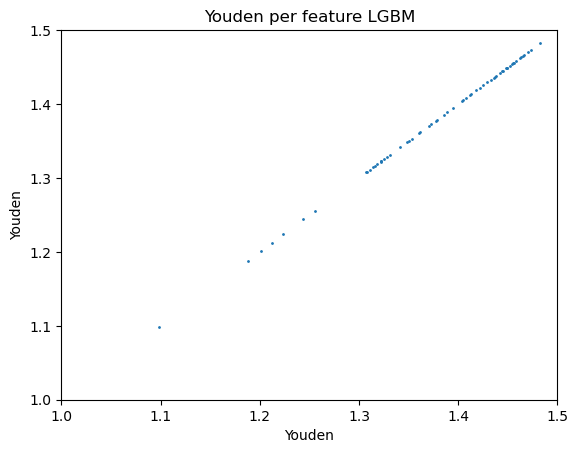

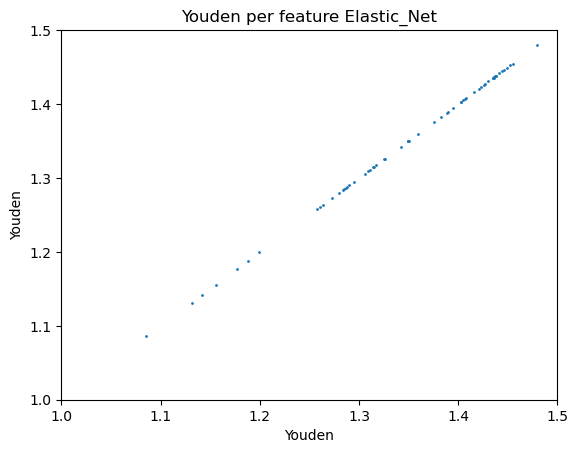

In [9]:
cutoff , model_pred_test= get_optimized_cutoff(lgbm_preds_test,X_test, y_test, 0.8, "expert", "LGBM")
cutoff2 , model_pred_test_xgb= get_optimized_cutoff(xgb_preds_test,X_test, y_test, 0.8,"expert", "XGBoost")
cutoff3 , model_pred_test_en= get_optimized_cutoff(en_preds_test,X_test, y_test, 0.8,"expert", "ElasticNet")

feature_selected_xgb = significativite_mesure(X_test, y_test, model_pred_test_xgb, "XGBoost",'expert', 0.7,0.3)
feature_selected_lgbm = significativite_mesure(X_test, y_test, model_pred_test, "LGBM",'expert',0.7,0.3)
feature_selected_en = significativite_mesure(X_test, y_test, model_pred_test_en, "Elastic_Net",'expert',0.7,0.3)

pd.options.display.max_rows = None

feature_results = feature_selected_xgb.merge(feature_selected_lgbm, on = "feature", how = 'outer')
feature_results = feature_results.merge(feature_selected_en, on = "feature", how = 'outer').fillna(0)

feature_results['modele_plus_performant'] = feature_results.apply(get_max, axis = 1) 
feature_results['mesure_max'] = feature_results.apply(lambda x : max(x.mesure_XGBoost, x.mesure_LGBM, x.mesure_Elastic_Net), axis = 1) 

print(feature_results['modele_plus_performant'].value_counts())
print(feature_results[['feature', 'mesure_max']].sort_values(by = 'mesure_max', ascending = False))
